<a href="https://colab.research.google.com/github/Zevhys/Proyek-Image-Generation/blob/claude%2Fsubmission-requirements-review-k77ual/Pipeline_submission_BFGAI_Rakha.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Preparing Dependancies**

In [ ]:
# Instalasi dependency untuk pipeline Stable Diffusion.
# Colab sudah menyediakan torch dengan CUDA, jadi torch tidak perlu diinstal ulang.
!pip install -q --upgrade diffusers transformers accelerate safetensors


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 394.3/394.3 kB 16.0 MB/s eta 0:00:00


# **Kriteria 1: Melakukan Image Generation dari Teks (Text-to-Image)**

## **Load Base Pipeline Model**

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from diffusers import StableDiffusionPipeline

# ---------------------------------------------------------------------------
# Konstanta wajib submission
# ---------------------------------------------------------------------------
# Catatan penting mengenai ID model:
# Template awal menggunakan "runwayml/stable-diffusion-v1-5", namun repositori
# tersebut sudah tidak lagi tersedia di Hugging Face sehingga pemanggilannya
# akan gagal. Instruksi submission sendiri mewajibkan ID di bawah ini, yang
# merupakan lokasi resmi baru untuk bobot model yang sama persis.
MODEL_T2I = "stable-diffusion-v1-5/stable-diffusion-v1-5"

SEED = 222  # Seed wajib untuk Kriteria 1

PROMPT = (
    "2D cartoon illustration of an astronaut wearing a white spacesuit walking "
    "on the moon, ground level view of a vast lunar landscape, dusty grey and "
    "brown moon ground with craters and small rocks covering the bottom half "
    "of the picture, distant horizon line of low lunar hills, black night sky "
    "full of stars above the horizon, planet Earth small in the upper right "
    "corner of the sky"
)

# Negative prompt yang telah ditetapkan instruksi submission.
# Teks di bawah ini disalin persis dari instruksi dan tidak boleh diubah.
NEGATIVE_PROMPT = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, "
    "chromatic aberration"
)

# ---------------------------------------------------------------------------
# Pemuatan pipeline
# ---------------------------------------------------------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
dtype = torch.float16 if device == "cuda" else torch.float32
print(f"Device : {device}")
print(f"Dtype  : {dtype}")

pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_T2I,
    dtype=dtype,
    safety_checker=None,
    requires_safety_checker=False,
)
pipe = pipe.to(device)
pipe.enable_attention_slicing()  # menekan pemakaian VRAM pada GPU T4

# Konfigurasi scheduler bawaan disimpan agar dapat dipulihkan kapan saja
# tanpa perlu memuat ulang seluruh model.
DEFAULT_SCHEDULER_CONFIG = pipe.scheduler.config
print(f"Scheduler bawaan: {type(pipe.scheduler).__name__}")


def show_images(images, titles=None, cols=2, figsize=None):
    """Menampilkan sekumpulan gambar dalam bentuk grid."""
    n = len(images)
    rows = (n + cols - 1) // cols
    if figsize is None:
        figsize = (4.5 * cols, 4.8 * rows)

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.array(axes).reshape(-1)

    for i, ax in enumerate(axes):
        if i < n:
            ax.imshow(images[i])
            if titles is not None:
                ax.set_title(titles[i], fontsize=11)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


Device : cuda
Dtype  : torch.float16


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Scheduler bawaan: PNDMScheduler


## **Generate Image (generate_simple_image)**
Pada bagian ini, Anda akan menghasilkan gambar dari teks. Sasarannya adalah menghasilkan gambar yang mendekati gambar contoh di bawah ini, yaitu seorang astronaut di permukaan bulan dengan gaya digital art 2D. Perhatikan empat elemen visual utama berikut:

*   Astronaut berbaju putih
*   Permukaan bulan
*   Bumi di langit
*   Gaya ilustrasi 2D

(bukan foto realistis).

Gunakan Seed bernilai 222 dan negative prompt yang telah ditetapkan. Pastikan prompt yang Anda gunakan sama pada kedua fungsi agar hasilnya dapat dibandingkan secara objektif.

### **Referensi output:**

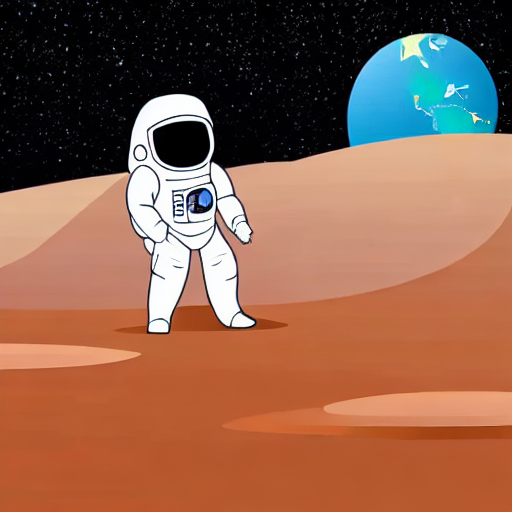

  0%|          | 0/50 [00:00<?, ?it/s]

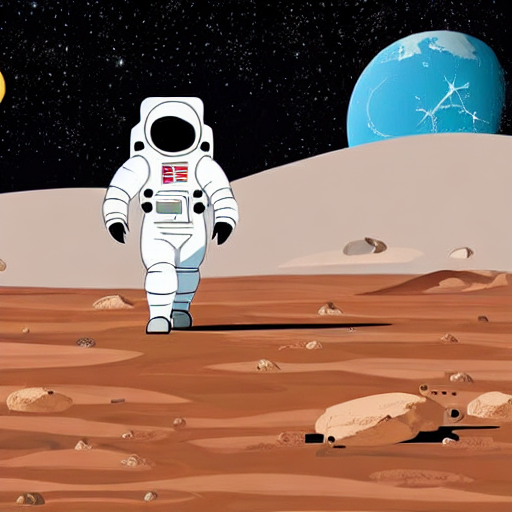

In [ ]:
def generate_simple_image(prompt, negative_prompt, seed):
    """Menghasilkan satu gambar dengan parameter paling dasar.

    Seluruh hyperparameter lain dibiarkan pada nilai bawaan pipeline
    (guidance_scale=7.5, num_inference_steps=50) sehingga fungsi ini menjadi
    titik pembanding bagi generate_advanced_image().
    """
    generator = torch.Generator(device=device).manual_seed(seed)

    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
    ).images[0]

    return image


simple_image = generate_simple_image(PROMPT, NEGATIVE_PROMPT, SEED)
simple_image.save("astronaut_simple.png")
simple_image


## **Generate Image with Hyperparameter Configuration (generate_advanced_image)**
Tetap gunakan Seed bernilai 222 dan negative prompt yang telah ditetapkan. Pastikan prompt yang Anda gunakan sama pada kedua fungsi agar hasilnya dapat dibandingkan secara objektif.

### **Referensi Output:**

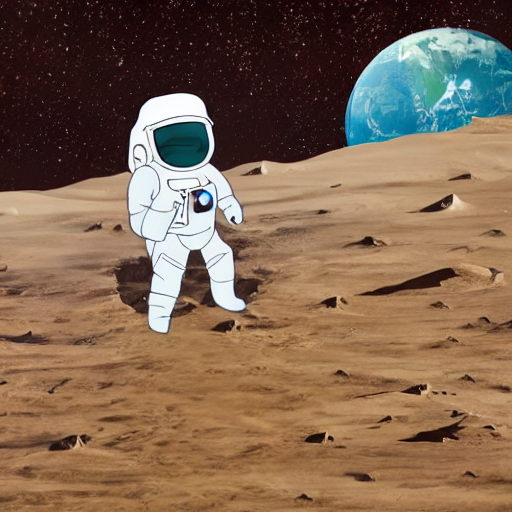

  0%|          | 0/50 [00:00<?, ?it/s]

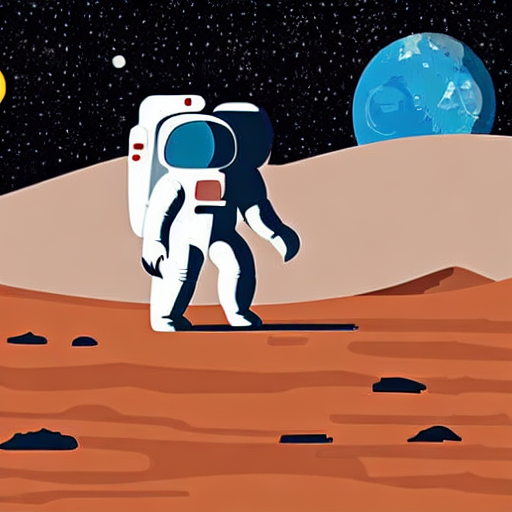

In [ ]:
def generate_advanced_image(prompt, negative_prompt, seed, guidance_scale, num_inference_step):
    """Versi lanjutan dengan kendali penuh atas guidance scale dan jumlah step.

    Prompt, negative prompt, dan seed sengaja dibuat sama dengan
    generate_simple_image() agar perbedaan hasil murni berasal dari kedua
    hyperparameter tambahan tersebut.
    """
    generator = torch.Generator(device=device).manual_seed(seed)

    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_step,
    ).images[0]

    return image


advanced_image = generate_advanced_image(
    prompt=PROMPT,
    negative_prompt=NEGATIVE_PROMPT,
    seed=SEED,
    guidance_scale=9.0,
    num_inference_step=50,
)
advanced_image.save("astronaut_advanced.png")
advanced_image


## **Guidance Scale Comparison**

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

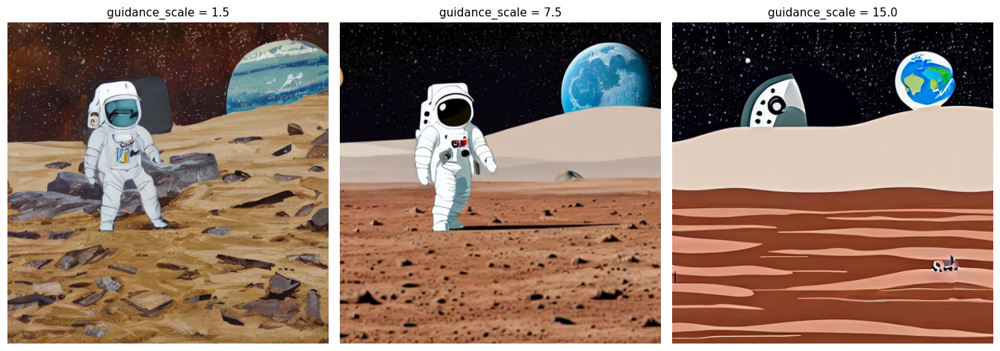

In [ ]:
# Perbandingan guidance scale rendah dan tinggi.
# Seed dan jumlah step dikunci agar satu-satunya variabel yang berubah
# adalah guidance scale itu sendiri.
guidance_values = [1.5, 7.5, 15.0]

guidance_images = [
    generate_advanced_image(
        prompt=PROMPT,
        negative_prompt=NEGATIVE_PROMPT,
        seed=SEED,
        guidance_scale=g,
        num_inference_step=30,
    )
    for g in guidance_values
]

show_images(
    guidance_images,
    titles=[f"guidance_scale = {g}" for g in guidance_values],
    cols=3,
)


### **Guidance Scale Explanation:**

Ketiga gambar dihasilkan dengan seed 222 dan 30 step. Satu-satunya variabel yang berubah adalah nilai guidance scale, sehingga seluruh perbedaan di bawah ini murni berasal dari parameter tersebut.

*   **Gambar dengan "Scale" Rendah (1.5):**
*Gaya ilustrasi 2D yang diminta gagal terbentuk. Yang muncul justru permukaan berpasir dan bebatuan dengan tekstur fotografis, lengkap dengan bayangan dan gradasi yang halus. Yang menarik, hasil ini melanggar negative prompt: kata photorealistic dan realistic jelas tercantum di sana, tetapi tetap saja muncul. Penyebabnya, prompt positif dan negative prompt dikendalikan oleh mekanisme classifier free guidance yang sama, sehingga ketika guidance diperlemah, penolakan terhadap negative prompt ikut melemah. Elemen langit hitam berbintang juga hilang dan tergantikan langit cokelat berkabut. Astronot masih ada, namun ukurannya kecil dan menempel canggung pada latar. Tingkat detail permukaannya paling tinggi di antara ketiganya, tetapi detail itu bukan detail yang diminta prompt. Variasi visualnya paling besar dan paling sulit ditebak.*

*   **Gambar dengan "Scale" Tinggi (15.0):**
*Gaya datar yang diminta terlihat paling ekstrem: tanah disederhanakan menjadi pita-pita warna rata tanpa tekstur sama sekali, langit menjadi hitam pekat, dan bumi digambar paling tegas serta paling detail di antara ketiganya. Namun harga yang dibayar sangat mahal, yaitu subjek utamanya justru hilang. Astronot tidak lagi terlihat dan hanya menyisakan objek putih menyerupai badan roket di pojok kiri atas. Inilah gejala over guidance: model ditekan terlalu keras untuk menuruti kata kunci gaya sehingga ia menyederhanakan gambar secara berlebihan dan mengorbankan objek yang seharusnya menjadi pusat perhatian. Kontrasnya paling keras dan komposisinya paling kaku.*

**Kesimpulan:** guidance scale mengatur seberapa keras model dipaksa menuruti teks. Nilai terlalu rendah membuat gambar melenceng dari permintaan sekaligus melemahkan negative prompt, sedangkan nilai terlalu tinggi membuat model menyederhanakan gambar sampai subjek utamanya lenyap. Nilai 7.5 memberi hasil paling seimbang: astronot utuh, tanah bulan bertekstur wajar, garis cakrawala jelas, satu bumi di langit hitam berbintang, dan gaya ilustrasi tetap terjaga.


## **Inference Steps Comparison**

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

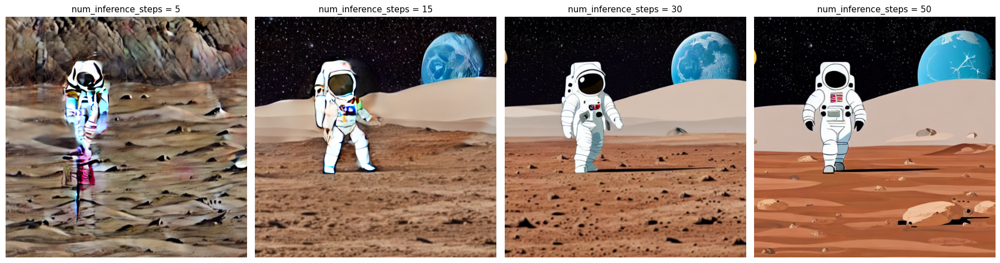

In [ ]:
# Perbandingan jumlah inference step rendah dan tinggi.
# Guidance scale dikunci di 7.5 dan seed tetap 222.
step_values = [5, 15, 30, 50]

step_images = [
    generate_advanced_image(
        prompt=PROMPT,
        negative_prompt=NEGATIVE_PROMPT,
        seed=SEED,
        guidance_scale=7.5,
        num_inference_step=s,
    )
    for s in step_values
]

show_images(
    step_images,
    titles=[f"num_inference_steps = {s}" for s in step_values],
    cols=4,
)


### **Inference Step Explanation:**

Keempat gambar dihasilkan dengan seed 222 dan guidance scale 7.5, sehingga perbedaannya hanya ditentukan oleh jumlah langkah denoising.

*   **Gambar dengan "Step" Rendah (5 dan 15):**
*Pada 5 step gambar jelas belum selesai. Proses denoising berhenti terlalu dini sehingga sisa noise masih tertinggal sebagai sapuan berserabut yang menutupi seluruh bidang. Astronot hanya berupa coretan putih kemerahan yang meleleh tanpa bentuk yang bisa dikenali, dan permukaan tanah berubah menjadi guratan menyerupai lelehan. Ironisnya, hasil ini justru memunculkan tiga hal yang secara eksplisit dilarang negative prompt, yaitu blurry, grainy, dan unfinished. Pada 15 step bentuk sudah terbaca: astronot berdiri utuh, garis cakrawala muncul, dan bumi mulai terbentuk. Meski begitu permukaannya masih kasar berbintik dan bagian helm masih gelap tidak beraturan. Waktu komputasi keduanya paling singkat di antara keempat percobaan.*

*   **Gambar dengan "Step" Tinggi (30 dan 50):**
*Pada 30 step gambar sudah bersih. Astronot tergambar jelas dengan garis tepi tegas, bayangannya terbentuk di permukaan tanah, dan bintik-bintik noise sudah hilang. Lompatan kualitas terbesar memang terjadi pada rentang 15 ke 30 step ini. Pada 50 step hasilnya paling halus dan paling stabil, dengan bidang warna paling rata dan tampilan yang paling mendekati ilustrasi datar. Namun selisihnya terhadap 30 step sudah sangat tipis dan hanya terasa pada kehalusan permukaan, sementara waktu komputasinya naik hampir dua kali lipat sebanding dengan jumlah stepnya.*

**Kesimpulan:** menambah jumlah step memperbaiki ketajaman dan menghilangkan noise, tetapi keuntungannya menurun tajam setelah sekitar 30 step. Di atas titik jenuh tersebut biaya waktu terus bertambah sementara perbaikan visualnya nyaris tidak terlihat, sehingga 30 step merupakan pilihan paling efisien untuk prompt ini.


## **Batch Inference from One Prompt**

  0%|          | 0/30 [00:00<?, ?it/s]

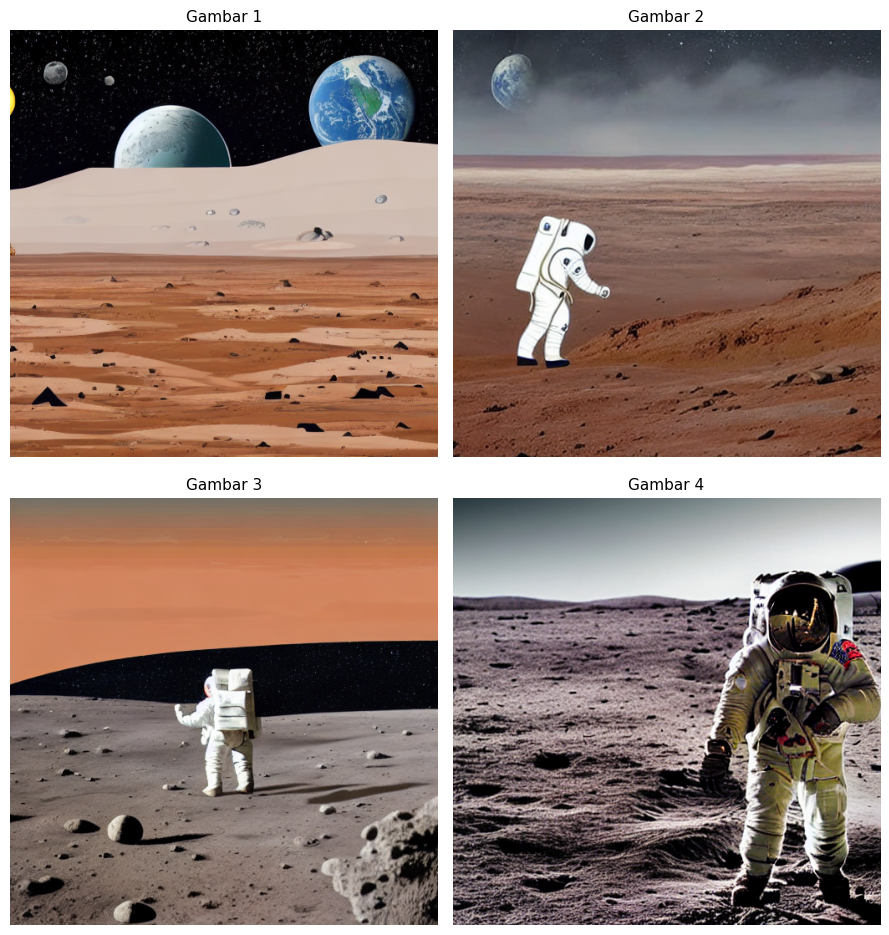

In [ ]:
def generate_batch_images(prompt, negative_prompt, seed, guidance_scale,
                          num_inference_step, num_images=4):
    """Batch inference: satu prompt menghasilkan beberapa gambar sekaligus.

    Pemanggilan pipeline dilakukan satu kali dengan num_images_per_prompt,
    sehingga jauh lebih hemat waktu dibanding memanggil pipeline berulang kali.
    """
    generator = torch.Generator(device=device).manual_seed(seed)

    result = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_step,
        num_images_per_prompt=num_images,
    )

    return result.images


batch_images = generate_batch_images(
    prompt=PROMPT,
    negative_prompt=NEGATIVE_PROMPT,
    seed=SEED,
    guidance_scale=7.5,
    num_inference_step=30,
    num_images=4,
)

# Ditampilkan sebagai grid 2x2
show_images(
    batch_images,
    titles=[f"Gambar {i + 1}" for i in range(len(batch_images))],
    cols=2,
)


## **Load Scheduler**

Euler A  -> EulerAncestralDiscreteScheduler


  0%|          | 0/30 [00:00<?, ?it/s]

DPM++    -> DPMSolverMultistepScheduler


  0%|          | 0/30 [00:00<?, ?it/s]

DDIM     -> DDIMScheduler


  0%|          | 0/30 [00:00<?, ?it/s]

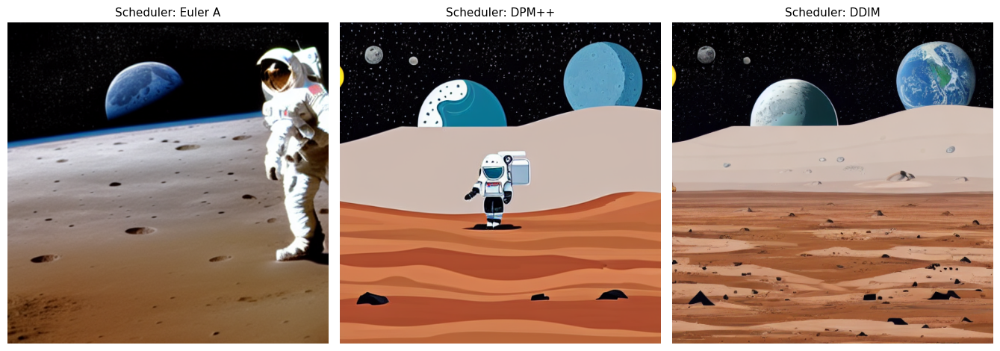

Scheduler dikembalikan ke: PNDMScheduler


In [ ]:
from diffusers import (
    EulerAncestralDiscreteScheduler,
    DPMSolverMultistepScheduler,
    DDIMScheduler,
    PNDMScheduler,
)


def load_scheduler(pipe, scheduler_name):
    """Mengganti algoritma sampling tanpa memuat ulang bobot model.

    Scheduler dibangun ulang dari konfigurasi scheduler yang sedang aktif
    (from_config), sehingga hanya komponen penjadwal yang ditukar sementara
    UNet, VAE, dan text encoder tetap berada di GPU.
    """
    if scheduler_name == "Euler A":
        pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)
    elif scheduler_name == "DPM++":
        pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
    elif scheduler_name == "DDIM":
        pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
    else:
        raise ValueError(f"Scheduler tidak dikenali: {scheduler_name}")

    return pipe


scheduler_names = ["Euler A", "DPM++", "DDIM"]
scheduler_images = []

for name in scheduler_names:
    pipe = load_scheduler(pipe, name)
    print(f"{name:8s} -> {type(pipe.scheduler).__name__}")

    scheduler_images.append(
        generate_advanced_image(
            prompt=PROMPT,
            negative_prompt=NEGATIVE_PROMPT,
            seed=SEED,
            guidance_scale=7.5,
            num_inference_step=30,
        )
    )

show_images(
    scheduler_images,
    titles=[f"Scheduler: {n}" for n in scheduler_names],
    cols=3,
)


# Kembalikan scheduler ke bawaan (PNDM) setelah perbandingan selesai.
# Tanpa ini, pipe akan tertinggal memakai DDIM dan tahap Base + Refiner
# pada Kriteria 2 akan berjalan dengan scheduler yang belum konvergen.
pipe.scheduler = PNDMScheduler.from_config(DEFAULT_SCHEDULER_CONFIG)
print(f"Scheduler dikembalikan ke: {type(pipe.scheduler).__name__}")

### **Scheduler Comparation:**

Ketiga gambar dihasilkan dengan seed 222, guidance scale 7.5, dan 30 step. Model tidak dimuat ulang sama sekali; hanya komponen scheduler yang ditukar melalui `from_config`, sehingga perbedaan hasil murni berasal dari algoritma sampling yang dipakai.

*   **Gambar dengan "Euler A Scheduler":**
*Hasilnya paling menyimpang dari gaya yang diminta. Alih-alih ilustrasi kartun, yang keluar justru gambar fotorealistik menyerupai dokumentasi misi Apollo, lengkap dengan pantulan cahaya pada visor helm dan bumi bertekstur awan yang realistis. Penyebabnya adalah sifat ancestral, yaitu penyuntikan noise acak baru pada setiap langkah, sehingga lintasan denoising-nya menjauh dari kedua scheduler lain meskipun seed yang dipakai identik. Konsekuensinya, scheduler ini yang paling sulit direproduksi hasilnya.*

*   **Gambar dengan "DPM++ Scheduler":**
*Hasilnya paling setia pada prompt. Gaya kartun datar terlihat paling kuat berupa bukit oranye berlapis, astronot kecil bergaya vektor dengan garis bersih, serta dua benda langit di atas cakrawala. Tidak ada artefak yang tersisa dan bidang warnanya rata. Scheduler ini memang dirancang mencapai konvergensi dengan cepat, sehingga pada 30 step gambarnya sudah benar-benar stabil.*

*   **Gambar dengan "DDIM Scheduler":**
*Bersifat deterministik karena tidak menambahkan noise acak selama sampling. Komposisinya paling mirip DPM++ dengan bukit berlapis dan bumi di kanan atas, tetapi warnanya lebih pucat, permukaannya lebih datar, dan astronotnya nyaris tidak terbentuk. Hal ini menunjukkan DDIM belum sepenuhnya konvergen pada 30 step dan umumnya membutuhkan lebih banyak langkah untuk mencapai ketajaman yang setara.*

**Kesimpulan:** perbedaan ketiga scheduler terletak pada karakter hasil, bukan pada kecepatan. Waktu eksekusinya terpantau berubah-ubah antar percobaan karena GPU Colab dipakai bersama banyak pengguna, sehingga tidak layak dijadikan dasar perbandingan. Dari sisi hasil, DPM++ paling unggul untuk prompt ini karena menghasilkan gambar paling bersih sekaligus paling setia pada gaya yang diminta. Euler A memberi variasi paling besar namun paling sulit dikendalikan. DDIM membutuhkan jumlah step lebih banyak agar hasilnya matang, terbukti dari astronot yang belum terbentuk utuh pada 30 step.

# **Kriteria 2: Menyempurnakan Gambar Melalui Image-to-Image**

## **Inpainting**

**Perhatian:** Gunakan gambar hasil `generate_advanced_image()` atau `generate_simple_image()` sebagai `image`, bukan gambar baru.

Hasil Inpainting yang Anda lakukan perlu dibuat semirip mungkin atau setidaknya menambahkan broken satelite seperti pada Gambar yang ditetapkan berikut ini. (Gunakan Seed bernilai 9)

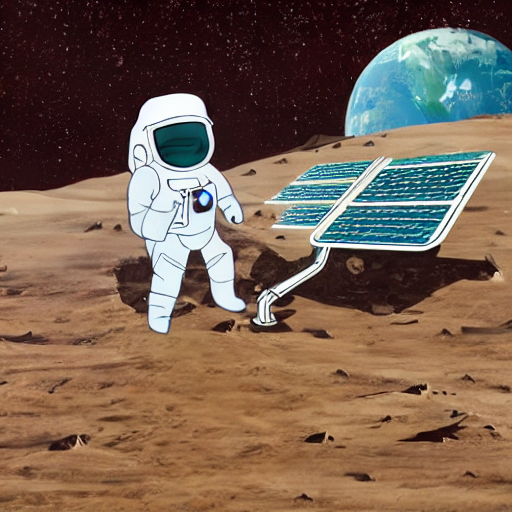

### **Load Model Inpainting**

### **Manual Masking**

### **Generate**

## **Inpainting Menggunakan Automasking**

Anda bebas untuk melakukan inpainting di area manapun menggunakan model segmentation. Terapkan inpainting pada gambar hasil inpainting manual di level basic sebelumnya.

### **load Model Segmentation Untuk Masking**

### **Masking with Segmentation Model**

### **Generate**

## **Outpainting**

**Perhatian:** Gunakan gambar hasil inpainting (manual atau otomatis) sebagai input pada tahap ini.

Pastikan outpainting yang dilakukan mendekati gambar yang diharapkan di bawah ini dan terlihat natural dan masih berhubungan dengan gambar dasar.

###**Referensi Expected Output:**

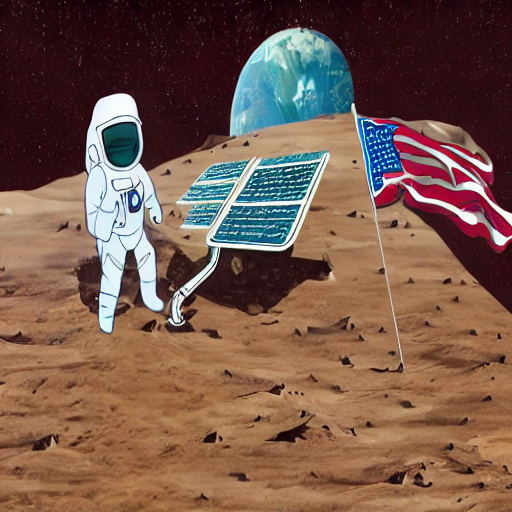

### **Prepare the Canvas**

### **Generate**

## **Outpainting Zoom Out**

**Perhatian:** Gunakan gambar hasil outpainting sebelumnya sebagai input pada tahap ini.

Pada tahap ini Anda tidak diharuskan untuk meniru spesifik satu gambar saja, tetapi berikut beberapa output yang dapat dijadikan referensi.

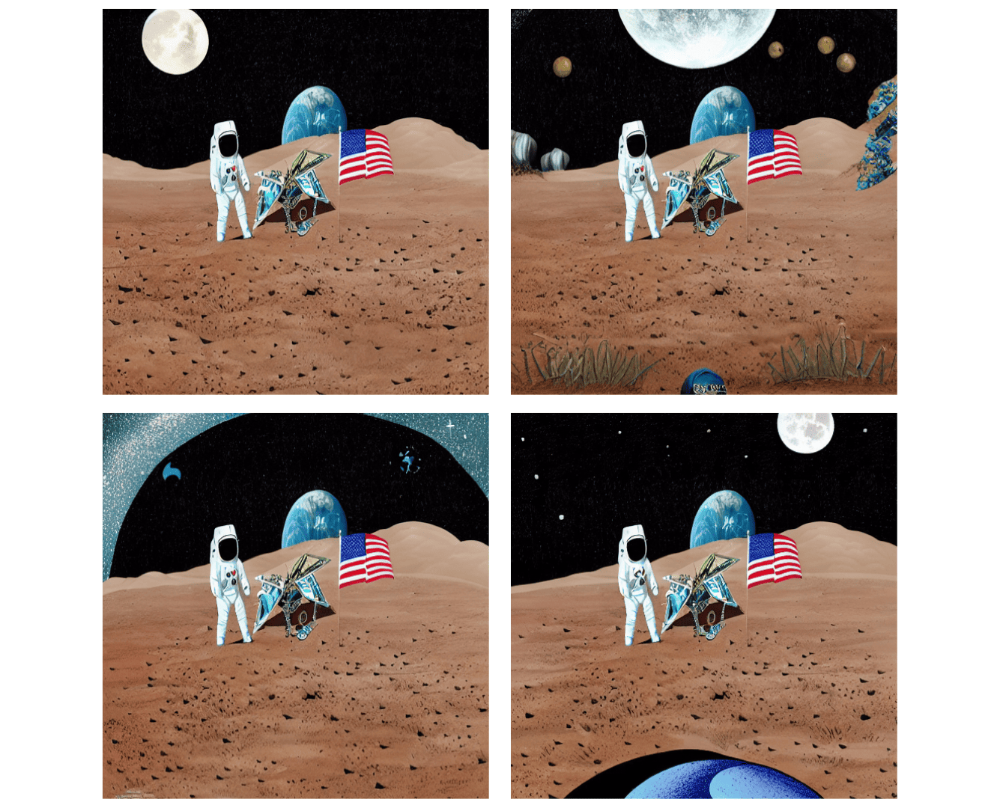

### **Prepare Canvas for Zoom Out**

### **Generate**

## **Base + Refiner Image Generation**